In [47]:
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import re

from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans


import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.impute import SimpleImputer

In [48]:
df = pd.read_csv("../data/listings.csv", sep = ",")

---------------
# Data Cleaning
---------------

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34664 entries, 0 to 34663
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            34664 non-null  int64  
 1   listing_url                                   34664 non-null  object 
 2   scrape_id                                     34664 non-null  int64  
 3   last_scraped                                  34664 non-null  object 
 4   source                                        34664 non-null  object 
 5   name                                          34664 non-null  object 
 6   description                                   33501 non-null  object 
 7   neighborhood_overview                         17016 non-null  object 
 8   picture_url                                   34664 non-null  object 
 9   host_id                                       34664 non-null 

### Target Feature
*******************

#### Converting to Numeric Value

In [53]:
# Price
df["price"] = df["price"].apply(lambda x: float(x[1:].replace(",","")) if pd.notna(x) else x)

#### NAs

In [55]:
df.price.isna().sum()

972

In [56]:
# Removing properties ithout a price
df = df.dropna(subset = "price")

#### Outliers

In [58]:
df.price.describe()

count     33692.000000
mean        731.188235
std        5667.250477
min           0.000000
25%         199.000000
50%         307.000000
75%         572.000000
max      633125.000000
Name: price, dtype: float64

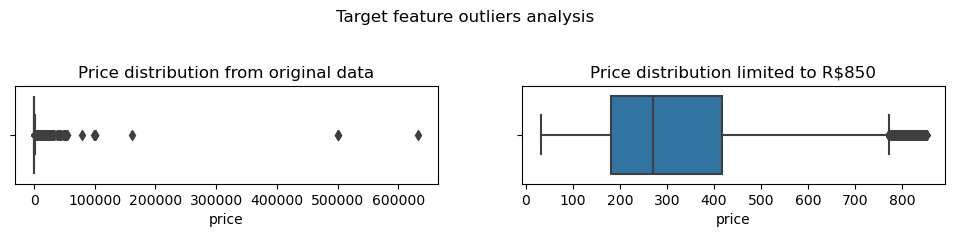

In [59]:
fig, ax = plt.subplots(ncols = 2, figsize=(12,2))

sns.boxplot(x='price', data=df, ax=ax[0])
sns.boxplot(x='price', data=df.loc[(df.price <= 850) & (df.price > 0), :], ax=ax[1])

ax[0].set_title("Price distribution from original data")
a1 = ax[1].set_title("Price distribution limited to R$850")



fig.subplots_adjust(top=0.6)
fig.suptitle("Target feature outliers analysis")
plt.show()

In [60]:
# Capping extreme high values - values bigger than 850 will be transformed in 850.
df.price = df.price.apply(lambda x: x if x <= 850 else 850)

# Removing property with price 0
df = df.loc[df.price > 0, :]

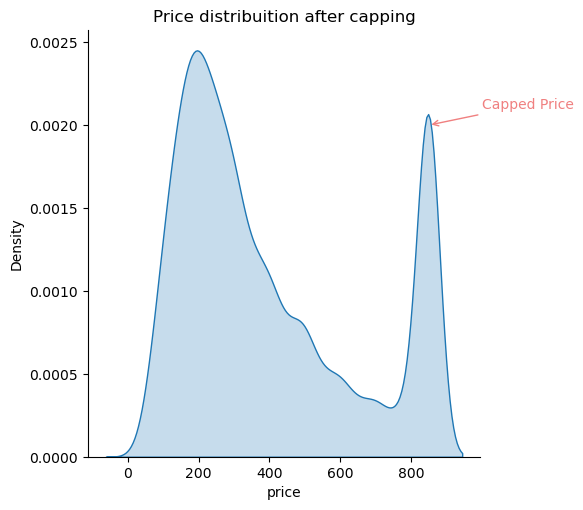

In [61]:
sns.displot(df, x = "price", kind = "kde", fill = "True")
ax = plt.gca()

# Add an annotation with an arrow
ax.annotate(
    "Capped Price",  
    xy=(850, 0.002),  
    xytext=(850 + 150, 0.0021),  
    arrowprops=dict(arrowstyle="->", color="lightcoral"), 
    color="lightcoral"
)
plt.title("Price distribuition after capping")
plt.show()

### Dropping features not relevant for the problem
-----------------------------------------------------

In [63]:
def remove_features_regex(rgx):
    feats = []
    for a_feat in df.columns:
        if re.match(rgx, a_feat):
             feats.append(a_feat)  
    return df.drop(feats, axis = 1)

df = remove_features_regex(".*host.*")
df = remove_features_regex(".*id.*")
df = remove_features_regex(".*url.*")


## Majority missing values
feat_na = df.isna().sum()

print(feat_na[feat_na > 0].sort_values(ascending = False).head(5))
nas_drop = ["calendar_updated", "license", "neighbourhood_group_cleansed", "neighbourhood", "neighborhood_overview"]

df = df.drop(nas_drop, axis = 1)

# Other non important features
not_relevant_drop = ["calendar_last_scraped", "name", "first_review", "last_review", "source", "last_scraped", "has_availability"]

df = df.drop(not_relevant_drop, axis = 1)

neighbourhood_group_cleansed    33691
license                         33691
calendar_updated                33691
neighbourhood                   17122
neighborhood_overview           17122
dtype: int64


----------------------
### Numerical Features
----------------------

In [65]:
df_numerical = df.select_dtypes(exclude = 'object')

#### NAs

In [67]:
# Show only features with NAs
print(df_numerical.isna().sum()[df_numerical.isna().sum() > 0])

# Bathrooms, bedrooms and beds = the missing information is penalized as 0
# Scores = Impute 0 to indicate the absence of score. It's not possible for a property to have reviews and that score be zero.

df[df_numerical.columns] = df[df_numerical.columns].fillna(0)

bathrooms                        23
bedrooms                         38
beds                             24
review_scores_rating           8089
review_scores_accuracy         8098
review_scores_cleanliness      8098
review_scores_checkin          8098
review_scores_communication    8098
review_scores_location         8098
review_scores_value            8100
reviews_per_month              8089
dtype: int64


### Outliers

In [69]:
df_numerical.iloc[:, 0:15].describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
count,33691.000000,33691.000000,33691.000000,33668.000000,33653.000000,33667.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000
mean,-22.967648,-43.248490,4.014455,1.551934,1.554156,2.273621,400.082782,3.609955,418.070226,3.313823,4.238550,514.393102,541.720697,3.660158,527.186035
std,0.034586,0.099623,2.338395,1.007678,1.047949,2.099932,254.140726,13.741691,414.065000,11.496802,14.037274,451.971896,455.819346,12.376279,449.299082
min,-23.073276,-43.723009,1.000000,0.000000,0.000000,0.000000,33.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,-22.984630,-43.302590,2.000000,1.000000,1.000000,1.000000,199.000000,1.000000,60.000000,1.000000,2.000000,90.000000,90.000000,1.300000,90.000000
50%,-22.972960,-43.194271,4.000000,1.000000,1.000000,2.000000,307.000000,2.000000,365.000000,2.000000,3.000000,365.000000,365.000000,2.000000,365.000000
75%,-22.956846,-43.185430,5.000000,2.000000,2.000000,3.000000,572.000000,3.000000,365.000000,3.000000,4.000000,1125.000000,1125.000000,3.000000,1125.000000
max,-22.749950,-43.104400,16.000000,29.000000,30.000000,56.000000,850.000000,1000.000000,1125.000000,630.000000,1125.000000,1125.000000,1125.000000,630.000000,1125.000000


In [70]:
df_numerical.iloc[:, 15:].describe()

,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,33691.000000,25602.000000,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000,25591.000000,25602.000000
mean,20.234810,43.838978,66.073788,205.610549,22.593749,7.761390,0.568995,4.802834,4.816552,4.765509,4.891744,4.881205,4.865371,4.720408,1.094172
std,10.940283,19.905304,27.820441,114.707026,44.422735,12.093731,1.149579,0.360016,0.356751,0.399811,0.281986,0.296750,0.290990,0.403923,1.200897
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000
25%,11.000000,32.000000,52.000000,90.000000,1.000000,0.000000,0.000000,4.750000,4.780000,4.690000,4.890000,4.880000,4.850000,4.650000,0.230000
50%,26.000000,54.000000,79.000000,193.000000,5.000000,2.000000,0.000000,4.920000,4.930000,4.900000,5.000000,5.000000,4.970000,4.820000,0.680000
75%,29.000000,59.000000,89.000000,322.000000,24.000000,11.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.550000
max,30.000000,60.000000,90.000000,365.000000,674.000000,132.000000,20.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,16.960000


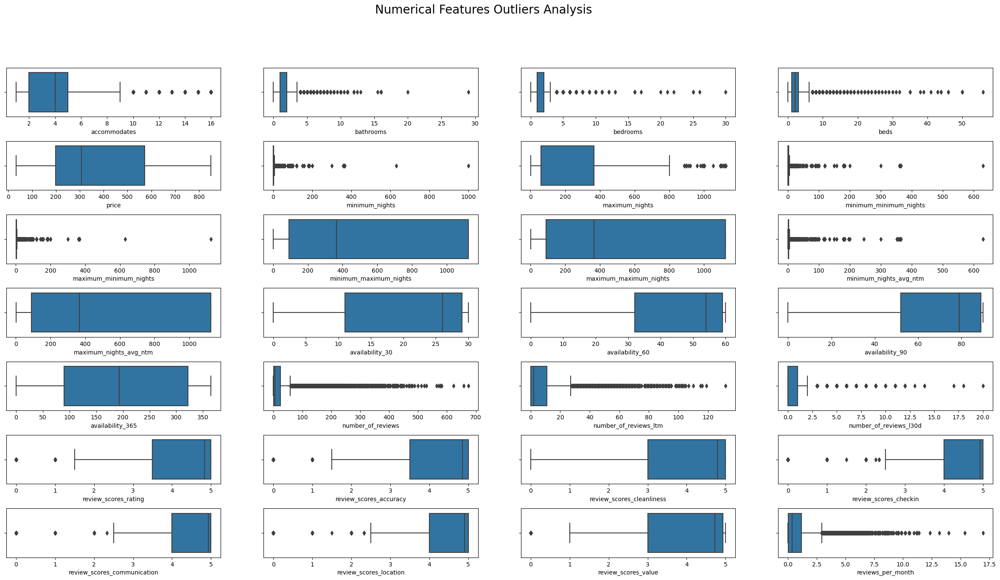

In [71]:
fig, ax = plt.subplots(nrows = 7, ncols = 4, figsize=(30,15))
fig.subplots_adjust(hspace=0.5)

line = 0
col = 0
index = [0,0]
for feat in df_numerical.drop(["longitude", "latitude"], axis = 1):        
    #Plot boxplot of current feature
    sns.boxplot(data = df,x = feat, ax = ax[line, col])
        
    #Update index for plotting for the next iteration
    if(col + 1 == 4):
        col = 0
        line += 1
    else:
        col +=1
        
fig.suptitle('Numerical Features Outliers Analysis', fontsize=20)
plt.show()

In [72]:
# Capping following feature to edeal with extreme values

def cap_feature(feat_value):
    for feature, value in feat_value:
        df[feature] = df[feature].apply(lambda x : x if x <= value else value)

cap_feature([("bathrooms", 5),
            ("bedrooms", 5),
            ("beds", 8),
            ("accommodates", 10),
            ("number_of_reviews", 100),
            ("number_of_reviews_l30d", 2.5),
            ("reviews_per_month", 4),
            ("number_of_reviews_ltm", 30),
            ("minimum_nights", 5),
            ("maximum_nights",800),
            ("minimum_minimum_nights", 5),
            ("maximum_minimum_nights", 6),
            ("minimum_nights_avg_ntm",5)])

#### Correlation Heatmap

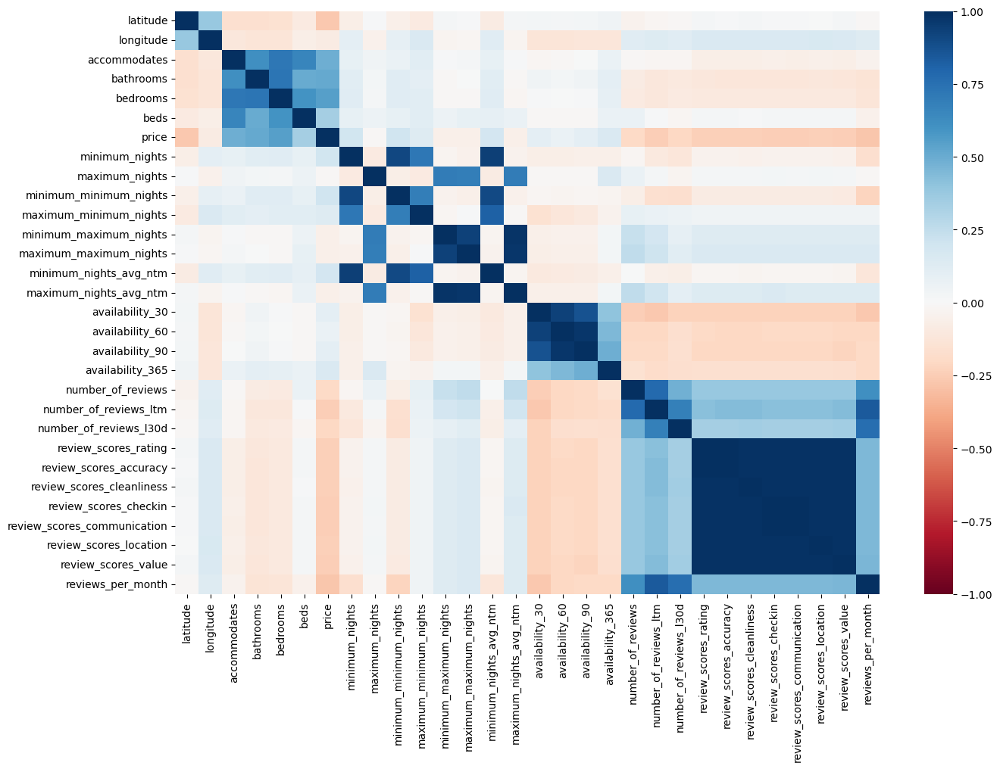

In [74]:
plt.figure(figsize=(15,10))
correlations = df.corr(numeric_only=True)
sns.heatmap(round(correlations,2), cmap='RdBu', annot=False, 
            annot_kws={"size": 7}, vmin=-1, vmax=1);

#### Latitude/Longitude

In [76]:
# As expected high priced properties are located along the coast.

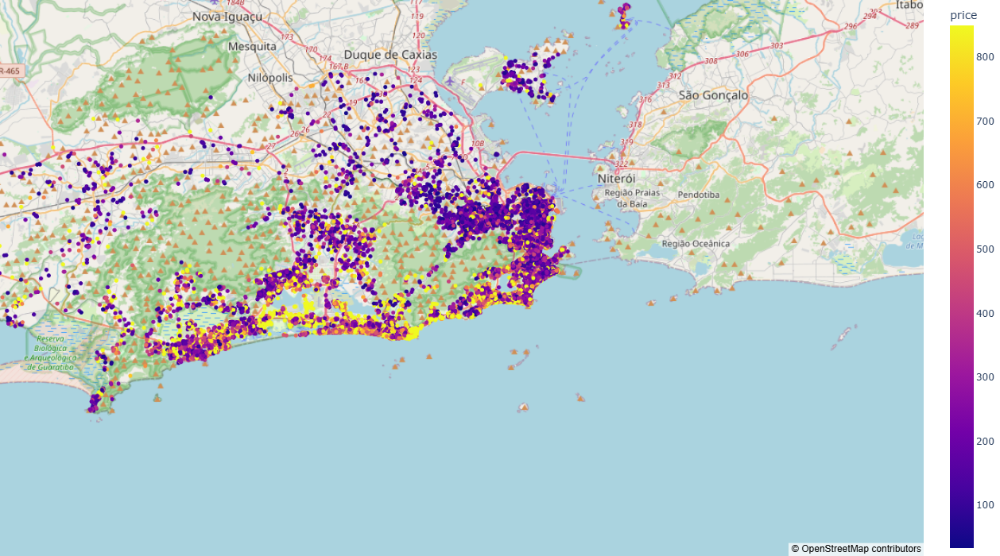

In [77]:
fig = px.scatter_mapbox(df, 
                  lat="latitude", 
                  lon="longitude",     
                  color="price",  
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

#### Accommodates, Bathroom, Bedrooms, Beds

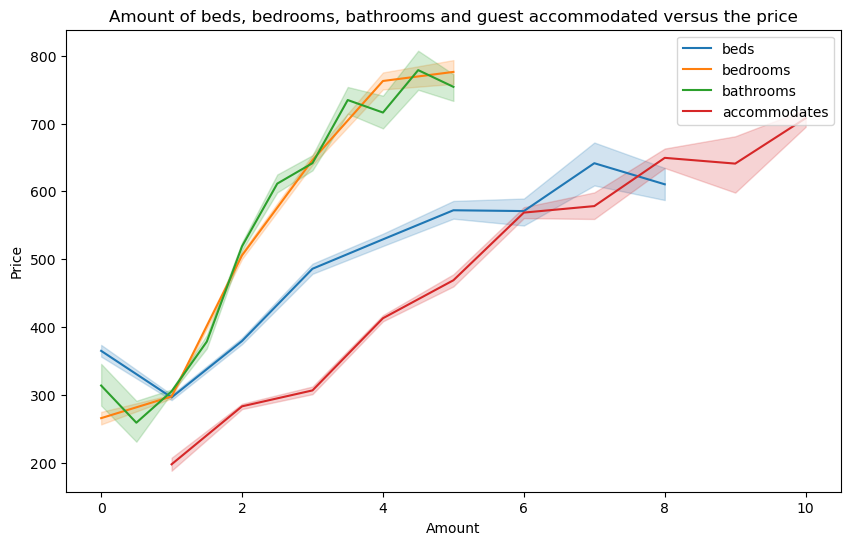

In [79]:
# Min 1 bed and max 7 beds
plt.figure(figsize=(10, 6))

sns.lineplot(data = df, x="beds", y="price", label="beds")
sns.lineplot(data = df, x="bedrooms", y="price", label="bedrooms")
sns.lineplot(data = df, x="bathrooms", y="price", label="bathrooms")
sns.lineplot(data = df, x="accommodates", y="price", label="accommodates")

plt.legend(loc = "upper right")

plt.ylabel("Price")
plt.xlabel("Amount")
plt.title("Amount of beds, bedrooms, bathrooms and guest accommodated versus the price")
plt.show()

#### Number of Nights (minimum/maximum)

In [81]:
nights = ['minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'price']

df[nights].corr()

,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,price
minimum_nights,1.000000,-0.085302,0.910704,0.720390,-0.027236,-0.054462,0.935881,-0.037436,0.189155
maximum_nights,-0.085302,1.000000,-0.073089,-0.087249,0.699702,0.686960,-0.077793,0.696433,-0.007950
minimum_minimum_nights,0.910704,-0.073089,1.000000,0.685854,-0.036218,-0.063479,0.899682,-0.048706,0.204267
maximum_minimum_nights,0.720390,-0.087249,0.685854,1.000000,-0.020863,0.010888,0.816549,-0.006065,0.132146
minimum_maximum_nights,-0.027236,0.699702,-0.036218,-0.020863,1.000000,0.933855,-0.027855,0.978384,-0.060781
maximum_maximum_nights,-0.054462,0.686960,-0.063479,0.010888,0.933855,1.000000,-0.038554,0.973547,-0.060189
minimum_nights_avg_ntm,0.935881,-0.077793,0.899682,0.816549,-0.027855,-0.038554,1.000000,-0.033581,0.177899
maximum_nights_avg_ntm,-0.037436,0.696433,-0.048706,-0.006065,0.978384,0.973547,-0.033581,1.000000,-0.063783
price,0.189155,-0.007950,0.204267,0.132146,-0.060781,-0.060189,0.177899,-0.063783,1.000000


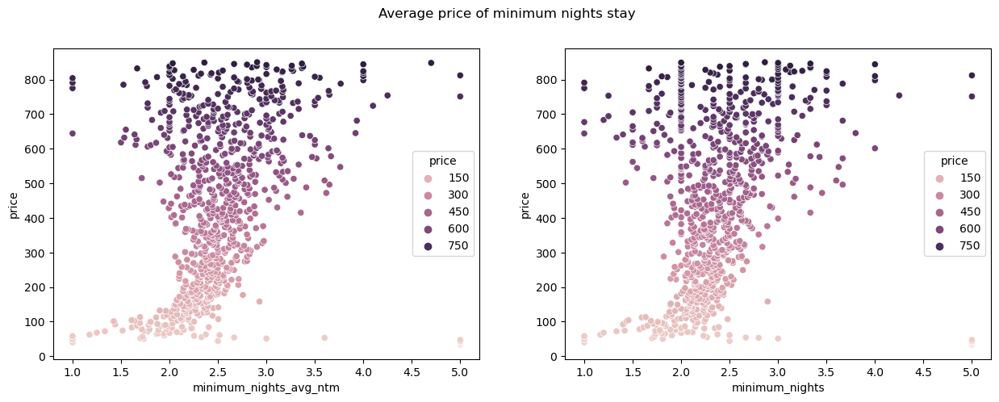

In [82]:
fig, ax = plt.subplots(ncols = 2, figsize=(15,5))

df_nights = df.groupby("price").mean(numeric_only = True)
sns.scatterplot(data=df_nights, x="minimum_nights_avg_ntm", y="price", hue="price", ax = ax[0])
sns.scatterplot(data=df_nights, x="minimum_nights", y="price", hue="price", ax = ax[1])

fig.suptitle("Average price of minimum nights stay")

plt.show()

#### Availability (360,90,60,30)

In [84]:
availability = ["availability_30","availability_60","availability_90","availability_365", "price"]

df[availability].corr()

# High correlation between them, which possibily indicates redundancy.

,availability_30,availability_60,availability_90,availability_365,price
availability_30,1.000000,0.928912,0.867857,0.404812,0.095936
availability_60,0.928912,1.000000,0.966840,0.452572,0.074707
availability_90,0.867857,0.966840,1.000000,0.486978,0.099591
availability_365,0.404812,0.452572,0.486978,1.000000,0.148103
price,0.095936,0.074707,0.099591,0.148103,1.000000


In [85]:
df.availability_365.describe()

count    33691.000000
mean       205.610549
std        114.707026
min          0.000000
25%         90.000000
50%        193.000000
75%        322.000000
max        365.000000
Name: availability_365, dtype: float64

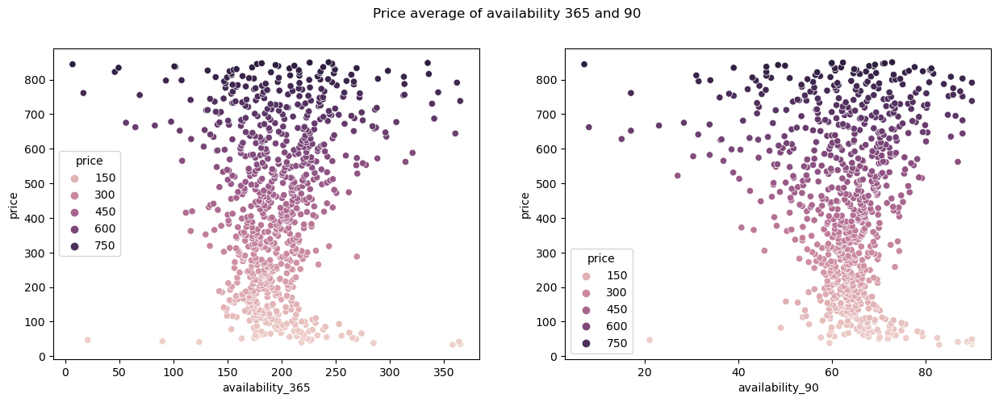

In [86]:
fig, ax = plt.subplots(ncols = 2, figsize=(15,5))

# availability_365
df_av = df.groupby("price").mean(numeric_only = True)
sns.scatterplot(data=df_av, x="availability_365", y="price", hue="price", ax=ax[0])

# availability_90
df_av = df.groupby("price").mean(numeric_only = True)
sns.scatterplot(data=df_av, x="availability_90", y="price", hue="price", ax=ax[1])

fig.suptitle("Price average of availability 365 and 90")

plt.show()

#### Reviews

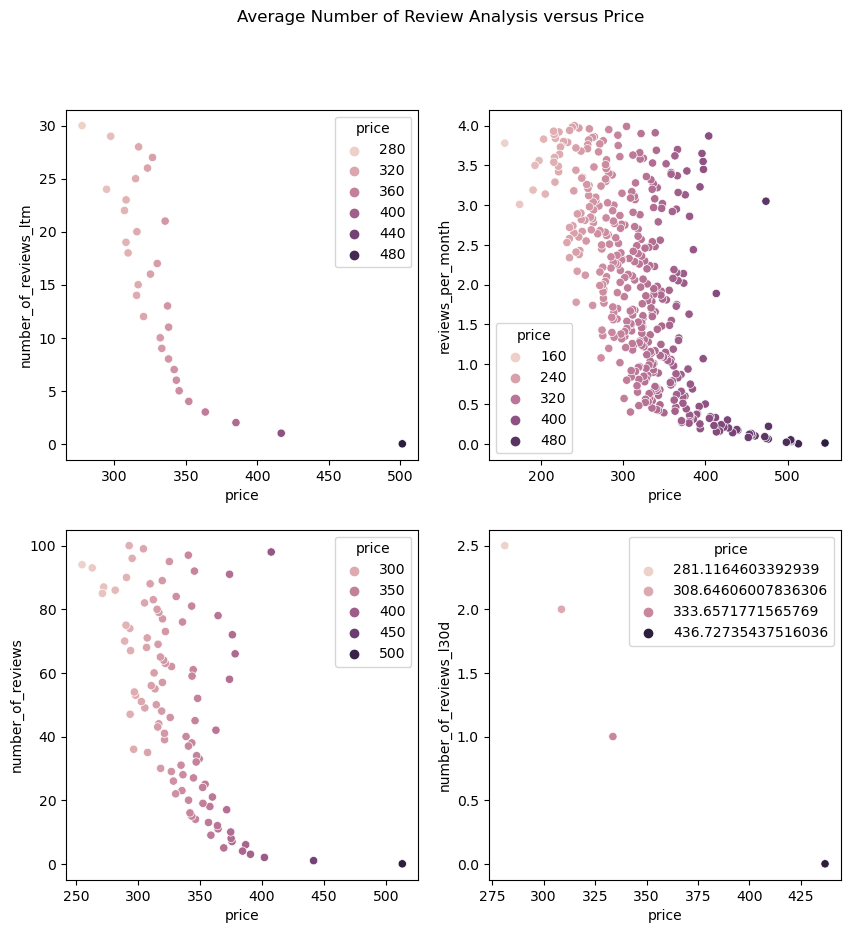

In [88]:
fig, ax = plt.subplots(2,2, figsize=(10,10))

#number_of_reviews_ltm
df_price_reviews = df.loc[:,["number_of_reviews_ltm", "price"]].groupby("number_of_reviews_ltm").mean().sort_values(by = "price", ascending = False)
sns.scatterplot(data=df_price_reviews, x="price", y=df_price_reviews.index, hue="price", ax = ax[0,0])

#reviews_per_month
df_price_reviews = df.loc[:,["reviews_per_month", "price"]].groupby("reviews_per_month").mean().sort_values(by = "price", ascending = False)
sns.scatterplot(data=df_price_reviews, x="price", y=df_price_reviews.index, hue="price", ax = ax[0,1])

#
df_price_reviews = df.loc[:,["number_of_reviews", "price"]].groupby("number_of_reviews").mean().sort_values(by = "price", ascending = False)
sns.scatterplot(data=df_price_reviews, x="price", y=df_price_reviews.index, hue="price", ax = ax[1,0])


#
df_price_reviews = df.loc[:,["number_of_reviews_l30d", "price"]].groupby("number_of_reviews_l30d").mean().sort_values(by = "price", ascending = False)
sns.scatterplot(data=df_price_reviews, x="price", y=df_price_reviews.index, hue="price", ax = ax[1,1])

fig.suptitle("Average Number of Review Analysis versus Price")
plt.show()

#### Scores

In [90]:
score_features = ["review_scores_value", "review_scores_accuracy", "review_scores_rating", "review_scores_checkin", "review_scores_cleanliness", "review_scores_communication", "review_scores_location", "price"]
df.loc[:,score_features].corr().price.sort_values(ascending = False, key = abs)

price                          1.000000
review_scores_value           -0.251338
review_scores_communication   -0.246612
review_scores_checkin         -0.245826
review_scores_accuracy        -0.243425
review_scores_cleanliness     -0.243301
review_scores_rating          -0.242360
review_scores_location        -0.238619
Name: price, dtype: float64

----------------------
### Categorical Features
----------------------

In [92]:
df_categorical = df.select_dtypes(include = "object")

### NAs

In [94]:
df_categorical.isna().sum()

description               1129
neighbourhood_cleansed       0
property_type                0
room_type                    0
bathrooms_text              39
amenities                    0
instant_bookable             0
dtype: int64

In [95]:
# Replacing the NAs with empty string representing the absence of information.

# Description
df["description"] = df["description"].fillna("")

# Bathroom text
df.bathrooms_text = df.bathrooms_text.fillna("")

In [96]:
df_categorical.columns

Index(['description', 'neighbourhood_cleansed', 'property_type', 'room_type',
       'bathrooms_text', 'amenities', 'instant_bookable'],
      dtype='object')

#### Neighbourhood

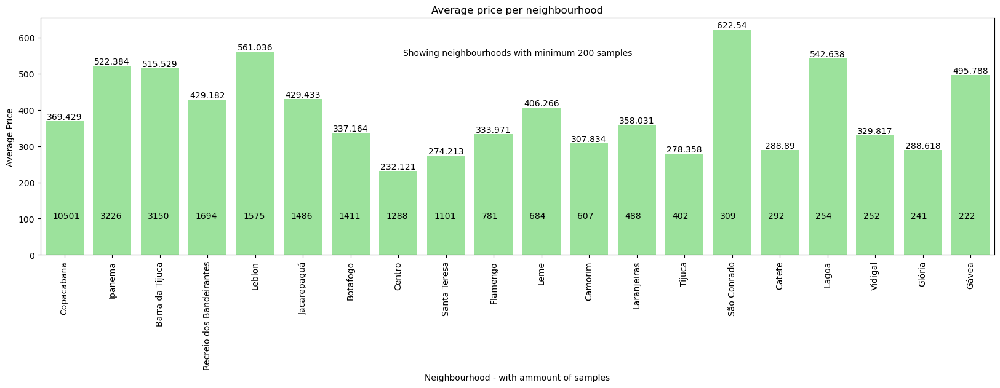

In [98]:
# Show only the neighborhoods that have at least 200 samples
NEIGHBOURHOOD_SAMPLES_CAP = 200

df_avg_neighbourhood = df[["neighbourhood_cleansed", "price"]].groupby("neighbourhood_cleansed").agg(count=('neighbourhood_cleansed','size'),
                                                                              price=('price', 'mean')).sort_values("count", ascending = False)
avg_neighbourhood = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP].price
avg_neighbourhood_count = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP]["count"]

sample_size = len(avg_neighbourhood.index)


plt.figure(figsize=(20, 5))
ax = sns.barplot(x=avg_neighbourhood.index, y=avg_neighbourhood, color = "lightgreen")
ax.bar_label(ax.containers[0], fontsize=10);
labels = plt.xticks(rotation=90)

#Will display the count for each neighbourhood
for i in range(sample_size):
    plt.text(i-0.25,100, avg_neighbourhood_count[i], color = "black")
    

plt.title("Average price per neighbourhood")
plt.ylabel("Average Price")
plt.xlabel("Neighbourhood - with ammount of samples")
ax.annotate('Showing neighbourhoods with minimum 200 samples', xy = (7, 2), xytext=(7.1, 550))

plt.show()

#### Property Type

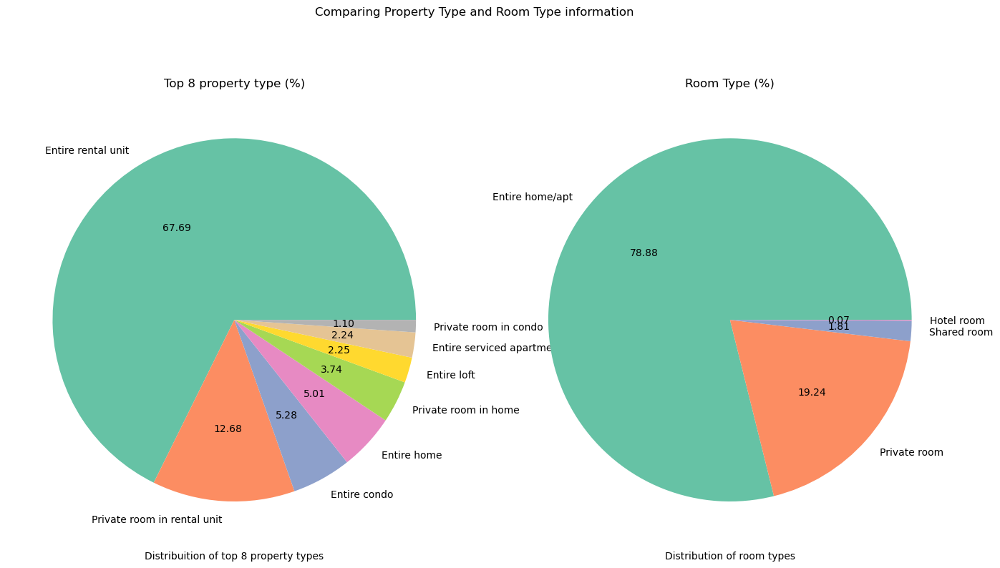

In [100]:
df_prop_type = df.property_type

fig, ax = plt.subplots(ncols = 2, figsize = (14,9))
fig.suptitle("Comparing Property Type and Room Type information")
fig.tight_layout()


ax[0].pie(df_prop_type.value_counts().head(8), labels = df_prop_type.value_counts().head(8).index, colors=sns.color_palette('Set2'), autopct='%.2f')
ax[0].set_title("Top 8 property type (%)")
ax[0].set_xlabel("Distribuition of top 8 property types")

ax[1].pie(df.room_type.value_counts(), labels = df.room_type.value_counts().index, colors=sns.color_palette('Set2'), autopct='%.2f')
ax[1].set_title("Room Type (%)")
ax[1].set_xlabel("Distribution of room types")

plt.show()

#### Room Type

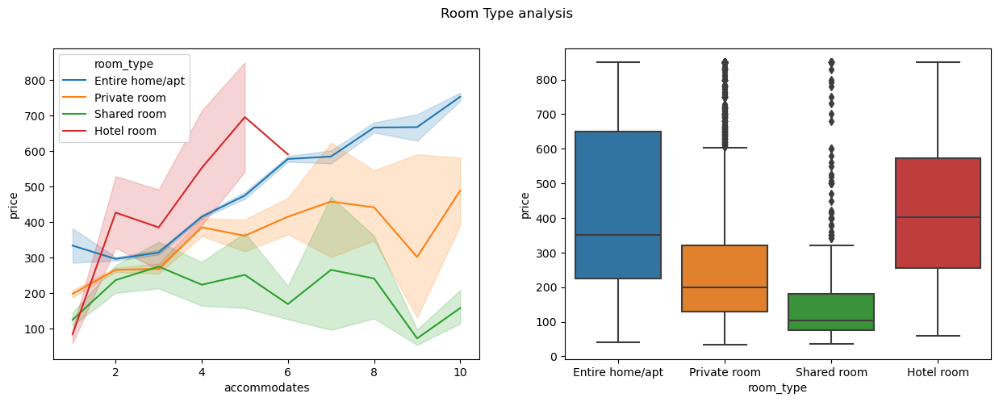

In [102]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

# Min 1 ppl and max 10 ppl
sns.lineplot(ax = ax[0], data = df.loc[(df.accommodates <=10) & (df.accommodates > 0),:], x="accommodates", y="price", hue = "room_type")
#Checking skeweness
sns.boxplot(data = df, x = df["room_type"], y=df.price, ax = ax[1])

fig.suptitle("Room Type analysis")

plt.show()

In [103]:
df.room_type.value_counts()

room_type
Entire home/apt    26577
Private room        6481
Shared room          609
Hotel room            24
Name: count, dtype: int64

In [104]:
# Considering Hotel Room as a Private Room

df.room_type = df.room_type.apply(lambda x: x if x!= "Hotel room" else "Private room")

df.room_type.value_counts()

room_type
Entire home/apt    26577
Private room        6505
Shared room          609
Name: count, dtype: int64

In [105]:
# Encode room_type so that each value represents a feature.
df = pd.concat([df,pd.get_dummies(df.room_type)], axis = 1)

---------------------
# Feature Extraction
---------------------

#### Amenities

In [108]:
# Convert the amenities string into a list of amenities
def count_amenities(amenities, features_dict):
    amenities_proc = amenities.replace("[", "").replace("]", "").replace('"', "")
    amenitites_splitted = amenities_proc.split(", ")
    
    for amn in amenitites_splitted:
        if amn in features_dict:
            features_dict.update({amn : features_dict[amn] + 1})
        else:
            features_dict.update({amn : 1})
            
#Check what kind of features the properties with higher and lower price have the most  
df_expensive = df.loc[df.price >= 600, :]    
df_cheap = df.loc[df.price < 600, :]    
    
# Dictionaries that will contain the top features for each type of property (expensive / cheap)
features_dict_expensive = {}
features_dict_cheap = {}

# Extract the amenities to each property type and their number of occurence
df_expensive.amenities.apply(lambda x: count_amenities(x, features_dict_expensive))
df_cheap.amenities.apply(lambda x: count_amenities(x, features_dict_cheap))

df_amn_count_expensive = pd.DataFrame.from_dict(features_dict_expensive, orient='index', columns = ["expensive count"])
df_amn_count_expensive = df_amn_count_expensive.sort_values(by = "expensive count", ascending = False)

df_amn_count_cheap = pd.DataFrame.from_dict(features_dict_cheap, orient='index', columns = ["cheap count"])
df_amn_count_cheap= df_amn_count_cheap.sort_values(by = "cheap count", ascending = False)

In [109]:
# This Data Frame shows the % of the presence of the amenities for the expensive properties and the cheap properties.
# The diff column shows the difference between these percentages. The goal is to identify the cases where the presence of the amenitiy was higher for
# the expensive properties.

process = df_amn_count_expensive.merge(df_amn_count_cheap, how="outer", left_index = True, right_index = True).sort_values(by="expensive count", ascending = False)


process["expensive count"] = (process["expensive count"]*100)/(df.loc[df.price >= 700, :].shape[0]) 
process["cheap count"] = (process["cheap count"]*100)/(df.loc[df.price < 700, :].shape[0]) 
process["diff"] = process["expensive count"] - process["cheap count"]

process.sort_values(by = "diff", ascending = False).head(30)

,expensive count,cheap count,diff
Free parking on premises,60.582323,22.952646,37.629677
Washer,70.011824,36.828227,33.183597
Air conditioning,82.604197,50.993500,31.610697
Kitchen,112.725392,85.764160,26.961232
Wifi,106.976057,83.587744,23.388313
Pool,28.022465,7.888579,20.133886
TV,69.391073,51.179201,18.211872
Elevator,62.030742,48.412256,13.618486
BBQ grill,21.282885,8.891365,12.391520
Outdoor shower,22.095773,9.782730,12.313043


In [110]:
# Based on this information, few amenities were selected to become new features indicating the presence or not of the amenities in the property.

amenities_dict = { "parking": ".*parking on premises.*",
                       "pool":".*pool.*(?!.*\btable\b).*",
                       "washer": ".*washer.*",
                       "dishwasher": ".*dishwasher.*",
                       "ceiling_fan" : ".*ceiling fan.*",
                       "long_term" : ".*long term.*",
                       "bbq_grill" : ".*bbq grill.*",
                       "outdoor": ".*outdoor.*",
                       "jacuzzi": ".*hot tub.*",
                       "bathtub": ".*bathtub.*",
                       "ac": [".*air conditioning.*","\\bac\\b"],
                       "seaview" : [".*beach view.*",".*sea view.*",".*ocean view.*"]
                     }

# Function convert amenities into features, indicating 1 if feature present in property or 0 if not.
def convert_amenities(amenities, index): 
    # For each amenity target
    for amn_name, amn_re in amenities_dict.items():
        if(isinstance(amn_re,list)):
            # Check each reg from the list of reg for an specific amenity. Ex ("seaview" : [".*beach view.*",".*sea view.*",".*ocean view.*"])
            for reg in amn_re:
                if(re.match(reg, str.lower(amenities))):
                    df.loc[index, "has_"+ amn_name] = 1
        else:
            if(re.match(amn_re, str.lower(amenities))):
                df.loc[index,"has_"+ amn_name] = 1
        

        
# 1) Create and initalize the features from the amenities list
has_amn_feat = ["has_" + x for x in amenities_dict.keys()]
df[has_amn_feat] = 0
        
# 2) For each amenities' list, check if they contain the amenities target
for index, row in df.iterrows():
    convert_amenities(df.loc[index, "amenities"], index)

In [111]:
has_re = 'has_.*'

# Retrieve only the amenitites' features
new_amenities = [x for x in df.columns if re.match(has_re, x)] + ["price"]

df[new_amenities].corr().price.sort_values(ascending = False, key = abs)

price              1.000000
has_pool           0.252967
has_parking        0.249446
has_washer         0.195738
has_jacuzzi        0.188039
has_ac             0.179525
has_dishwasher     0.153211
has_seaview        0.122426
has_bathtub        0.114234
has_ceiling_fan   -0.113849
has_outdoor        0.112627
has_bbq_grill      0.111628
has_long_term     -0.100335
Name: price, dtype: float64

#### Bathrooms Text

##### Creating "is_bathroom_shared feature"

In [114]:
# Creating a feature that indicates if bathroom is shared or not
def detect_bathroom_shared(a_bath):
            
            is_shared = 0 #default value

            # Case if it is a missing value
            if(pd.isna(a_bath)):
                is_shared = np.nan
                
            # Check if bathroom is shared using regex
            else:
                if(re.match(".*shared.*", str.lower(a_bath))):
                        is_shared = 1  


            return is_shared
            
    
df[["is_bathroom_shared"]] = df["bathrooms_text"].apply(lambda x: pd.Series(detect_bathroom_shared(x)))

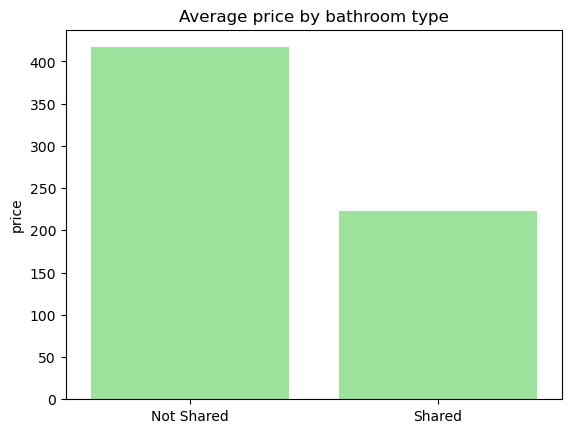

In [115]:
df_shared = df.groupby("is_bathroom_shared").mean(numeric_only = True)
ax = sns.barplot(data = df_shared, x= ["Not Shared", "Shared"], y="price", color = "lightgreen")
plt.title("Average price by bathroom type")
plt.show()

#### Description

In [117]:
### Preprocess text

def process_corpus(corpus):
            
            corpus = corpus.lower()
            corpus = re.sub(r'[^a-zA-Z ]', ' ', corpus)
            corpus = re.sub(r'\b(the|and|in|with|to|a|of|br|is|from|for|on|this|you|it|has|all|at|de|by|br)\b', ' ', corpus)
            corpus = re.sub(r'br\b', '', corpus)
            return corpus
    
df.description = df.description.apply(lambda x : process_corpus(x))

In [118]:
### Count the word frequency for expensive and cheap properties
### Creates 2 df with their respective counts for words exploration

# Contain the words frequency that will be transformed into a data frame after
word_expensive_dict = {}
word_cheap_dict = {}

def word_count(words_dict, description):
    for word in description.split():
        if word in words_dict:
            words_dict.update({word : words_dict[word]+1})
        else:
            words_dict.update({word : 1})
    

# FIlter by expensive and cheap properties
df.loc[df.price >= 500, :].description.apply(lambda x : word_count(word_expensive_dict,x))
df.loc[df.price < 500, :].description.apply(lambda x : word_count(word_cheap_dict,x))

total_expensive = df.loc[df.price >= 500, :].shape[0]
total_cheap = df.loc[df.price < 500, :].shape[0]

# Generate the word count for both types of properties
df_expensive_words = pd.DataFrame(word_expensive_dict.items(), columns = ["word", "count"]).sort_values(by = "count", ascending = False)
df_cheap_words = pd.DataFrame(word_cheap_dict.items(), columns = ["word", "count"]).sort_values(by = "count", ascending = False)

In [119]:
WORDS = ["lux","luxurious","luxury","fancy","garage", 
                        "hydromassage", "cellar", "sophistication", 
                        "magnificent", "colonial", "rooftop", "triplex", "suite", "pool"]



print("\n% of pre-defined 'lux' words in both expensive and cheap properties:\n")

for word in WORDS:
    expensive_count = df_expensive_words.loc[df_expensive_words.word == word, "count"]
    cheap_count = df_cheap_words.loc[df_cheap_words.word == word, "count"]
    
    expensive_count = expensive_count.values[0] if not expensive_count.empty else 0
    cheap_count = cheap_count.values[0] if not cheap_count.empty else 0
    
    print(f"{word} => Expensive: {(expensive_count/total_expensive)*100:.2f} - Cheap {(cheap_count/total_cheap)*100:.2f}\n")


% of pre-defined 'lux' words in both expensive and cheap properties:

lux => Expensive: 0.05 - Cheap 0.00

luxurious => Expensive: 1.73 - Cheap 0.37

luxury => Expensive: 3.51 - Cheap 0.88

fancy => Expensive: 0.10 - Cheap 0.03

garage => Expensive: 5.54 - Cheap 3.54

hydromassage => Expensive: 0.40 - Cheap 0.12

cellar => Expensive: 0.33 - Cheap 0.03

sophistication => Expensive: 0.57 - Cheap 0.21

magnificent => Expensive: 0.69 - Cheap 0.22

colonial => Expensive: 0.43 - Cheap 0.28

rooftop => Expensive: 0.97 - Cheap 0.40

triplex => Expensive: 0.57 - Cheap 0.06

suite => Expensive: 14.90 - Cheap 9.31

pool => Expensive: 19.58 - Cheap 8.76



In [120]:
### Create new features that detects if the text contains fancy words that would indicate more expensive prroperty

def check_lux_corpus(x):
            
            # Transform list of words in regex
            words_str = ""
            for i in WORDS:
                words_str = words_str + i + "|"
            #remove last "|"
            words_str =  words_str[:-1] 
            regex = r'\b('+words_str+r')\b'
            
            
            # Return if description contains lux word or not
            if (re.search(regex, x)):
                return 1
            else:
                return 0
        
#Create the feature that identify a property as luxurious
df["contains_lux_description"] = df["description"].apply(check_lux_corpus)

In [121]:
df[["contains_lux_description", "price"]].corr(numeric_only = True)

,contains_lux_description,price
contains_lux_description,1.000000,0.197171
price,0.197171,1.000000


#### Latitude/Longitude

##### Clustering - refining neighbourhood division

In [124]:
# Initialize the model
k_means = KMeans(
    init = "random",
    n_clusters = 25,
    n_init = 10,
    max_iter = 500,
    random_state = 69
)


#Prepare the data
#df_kmeans = df.loc[:,["latitude", "longitude", "has_beach_access"]]
df_kmeans = df.loc[:,["latitude", "longitude"]]

# Fitting
k_means.fit(df_kmeans)

#Clusters as a feature
df_kmeans['geo_cluster'] = k_means.labels_ 
df_kmeans['price'] = df.price

df["geo_cluster"] = df_kmeans['geo_cluster']

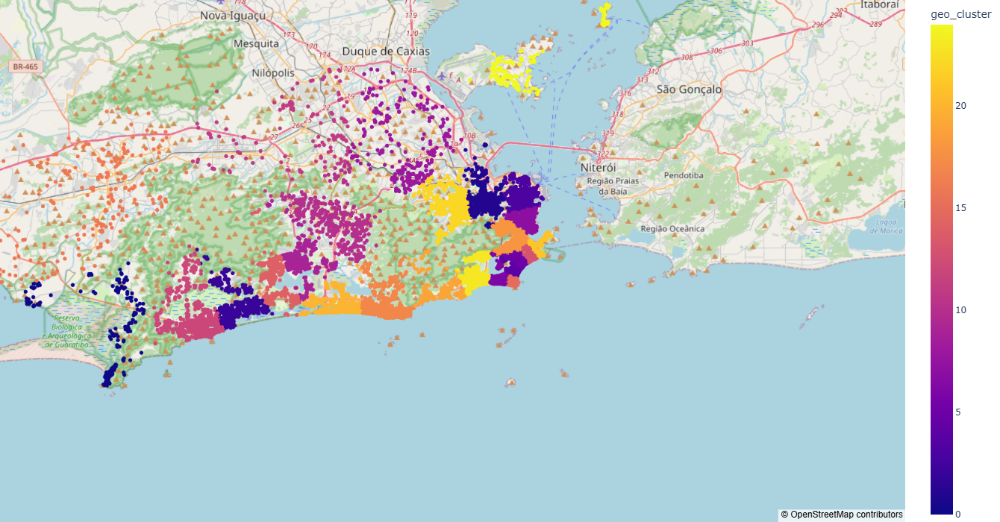

In [125]:
fig = px.scatter_mapbox(df_kmeans, 
                  lat="latitude", 
                  lon="longitude",     
                  color="geo_cluster",
                  hover_name = "price", 
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [126]:
df[["geo_cluster", "price"]].corr()

,geo_cluster,price
geo_cluster,1.000000,0.141166
price,0.141166,1.000000


-------------------
# Feature Selection
-------------------

In [128]:
feature_drop = ["amenities", "description", "neighbourhood_cleansed", "latitude", "longitude", "property_type", "room_type", "bathrooms_text",
               "maximum_minimum_nights","minimum_nights", "maximum_nights","minimum_minimum_nights", "minimum_maximum_nights", "maximum_maximum_nights",
               "maximum_nights_avg_ntm", "availability_30", "number_of_reviews_l30d", "number_of_reviews", 'review_scores_rating', 'review_scores_accuracy',
               'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'instant_bookable']

df = df.drop(feature_drop, axis = 1)

In [129]:
df.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'minimum_nights_avg_ntm', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews_ltm', 'review_scores_value',
       'reviews_per_month', 'Entire home/apt', 'Private room', 'Shared room',
       'has_parking', 'has_pool', 'has_washer', 'has_dishwasher',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_outdoor',
       'has_jacuzzi', 'has_bathtub', 'has_ac', 'has_seaview',
       'is_bathroom_shared', 'contains_lux_description', 'geo_cluster'],
      dtype='object')

-----------
# Encoding
----------

Normally would have done it before, but since different encoding techniques are going to be tested with different model, they are being done at the end before exporting the preprocessed dataset.

### Binary Encoding

In [133]:
import category_encoders as ce

bin_encoder = ce.BinaryEncoder(cols = ['geo_cluster'] , return_df = True)
df_bin = bin_encoder.fit_transform(df.drop("price", axis = 1))

In [134]:
df_bin.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds',
       'minimum_nights_avg_ntm', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews_ltm', 'review_scores_value',
       'reviews_per_month', 'Entire home/apt', 'Private room', 'Shared room',
       'has_parking', 'has_pool', 'has_washer', 'has_dishwasher',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_outdoor',
       'has_jacuzzi', 'has_bathtub', 'has_ac', 'has_seaview',
       'is_bathroom_shared', 'contains_lux_description', 'geo_cluster_0',
       'geo_cluster_1', 'geo_cluster_2', 'geo_cluster_3', 'geo_cluster_4'],
      dtype='object')

### Label Encoding

In [136]:
# (!) Geo-cluster is already encoded after KMean transformation. So just renaming the dataset for consistency

df_label = df

In [137]:
df_label.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'minimum_nights_avg_ntm', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews_ltm', 'review_scores_value',
       'reviews_per_month', 'Entire home/apt', 'Private room', 'Shared room',
       'has_parking', 'has_pool', 'has_washer', 'has_dishwasher',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_outdoor',
       'has_jacuzzi', 'has_bathtub', 'has_ac', 'has_seaview',
       'is_bathroom_shared', 'contains_lux_description', 'geo_cluster'],
      dtype='object')

### One-Hod-Encoding

In [139]:
from sklearn.preprocessing import OneHotEncoder

onehot_encoder_cluster = OneHotEncoder(sparse_output = False, feature_name_combiner='concat')
series_cluster_onehot = onehot_encoder_cluster.fit_transform(df[["geo_cluster"]])

df_onehot = df.drop("price", axis = 1).copy(deep = True)
df_onehot[onehot_encoder_cluster.get_feature_names_out(["geo_cluster"])] = series_cluster_onehot


In [140]:
df_onehot.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds',
       'minimum_nights_avg_ntm', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews_ltm', 'review_scores_value',
       'reviews_per_month', 'Entire home/apt', 'Private room', 'Shared room',
       'has_parking', 'has_pool', 'has_washer', 'has_dishwasher',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_outdoor',
       'has_jacuzzi', 'has_bathtub', 'has_ac', 'has_seaview',
       'is_bathroom_shared', 'contains_lux_description', 'geo_cluster',
       'geo_cluster_0', 'geo_cluster_1', 'geo_cluster_2', 'geo_cluster_3',
       'geo_cluster_4', 'geo_cluster_5', 'geo_cluster_6', 'geo_cluster_7',
       'geo_cluster_8', 'geo_cluster_9', 'geo_cluster_10', 'geo_cluster_11',
       'geo_cluster_12', 'geo_cluster_13', 'geo_cluster_14', 'geo_cluster_15',
       'geo_cluster_16', 'geo_cluster_17', 'geo_cluster_18', 'geo_cluster_19',
       'geo_cluster_20', 'geo_cluster_21', 'geo_cluster_22',

----------------
# Normalisation
----------------

In [142]:
from sklearn.preprocessing import MinMaxScaler

# Normalise all the 3 types of encoding dataset above
scaler = MinMaxScaler()
df_bin = pd.DataFrame(scaler.fit_transform(df_bin), columns= df_bin.columns, index = df_bin.index)
df_label = pd.DataFrame(scaler.fit_transform(df_label), columns= df_label.columns, index = df_label.index)
df_onehot = pd.DataFrame(scaler.fit_transform(df_onehot), columns= df_onehot.columns, index = df_onehot.index)

df_bin["price"] = df["price"]
df_label["price"] = df["price"]
df_onehot["price"] = df["price"]


-----------
# Exporting
-----------

In [144]:
df.shape

(33691, 30)